In [1]:
import xarray as xr
import numpy as np
import numpy as np
import xarray as xr
import os
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

In [3]:
ds=xr.open_dataset("/work/users/s233224/Climate-Change-Impacted-Solar-Energy-Generation/power/ACCESS-CM2_1x1grid/historical/aggregated_solar_power_seasons_2014.nc")
ds

<xarray.Dataset> Size: 63kB
Dimensions:  (x: 48, y: 40)
Coordinates:
  * x        (x) float64 384B -12.0 -11.0 -10.0 -9.0 ... 32.0 33.0 34.0 35.0
    lon      (x) float64 384B ...
  * y        (y) float64 320B 33.0 34.0 35.0 36.0 37.0 ... 69.0 70.0 71.0 72.0
    lat      (y) float64 320B ...
Data variables:
    Winter   (y, x) float64 15kB ...
    Spring   (y, x) float64 15kB ...
    Summer   (y, x) float64 15kB ...
    Autumn   (y, x) float64 15kB ...

/work/users/s233224/Climate-Change-Impacted-Solar-Energy-Generation/power/ACCESS-CM2_1x1grid/historical/
/work/users/s233224/Climate-Change-Impacted-Solar-Energy-Generation/power/CanESM5_1x1grid/historical/
/work/users/s233224/Climate-Change-Impacted-Solar-Energy-Generation/power/CMCC-CM2-SR5_1x1grid/historical/
/work/users/s233224/Climate-Change-Impacted-Solar-Energy-Generation/power/CMCC-ESM2_1x1grid/historical/
/work/users/s233224/Climate-Change-Impacted-Solar-Energy-Generation/power/HadGEM3-GC31-LL_1x1grid/historical/
/work/users/s233224/Climate-Change-Impacted-Solar-Energy-Generation/power/HadGEM3-GC31-MM_1x1grid/historical/
/work/users/s233224/Climate-Change-Impacted-Solar-Energy-Generation/power/MRI-ESM2-0_1x1grid/historical/


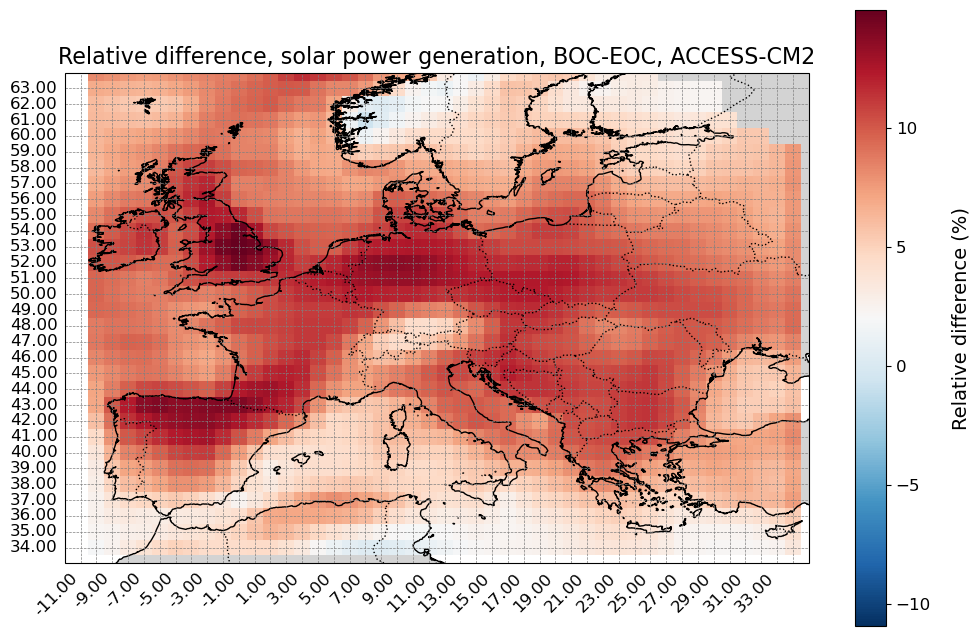

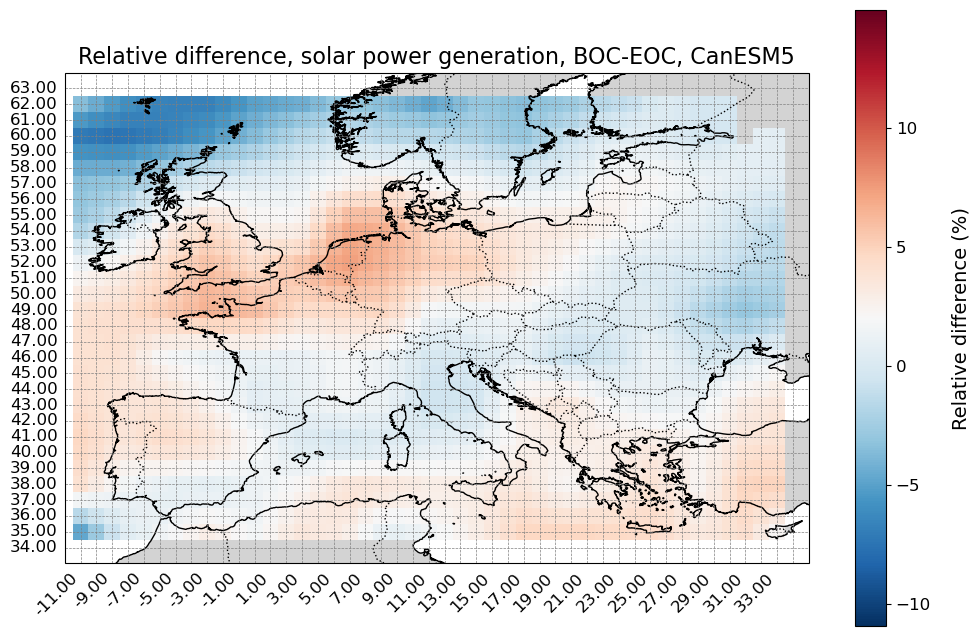

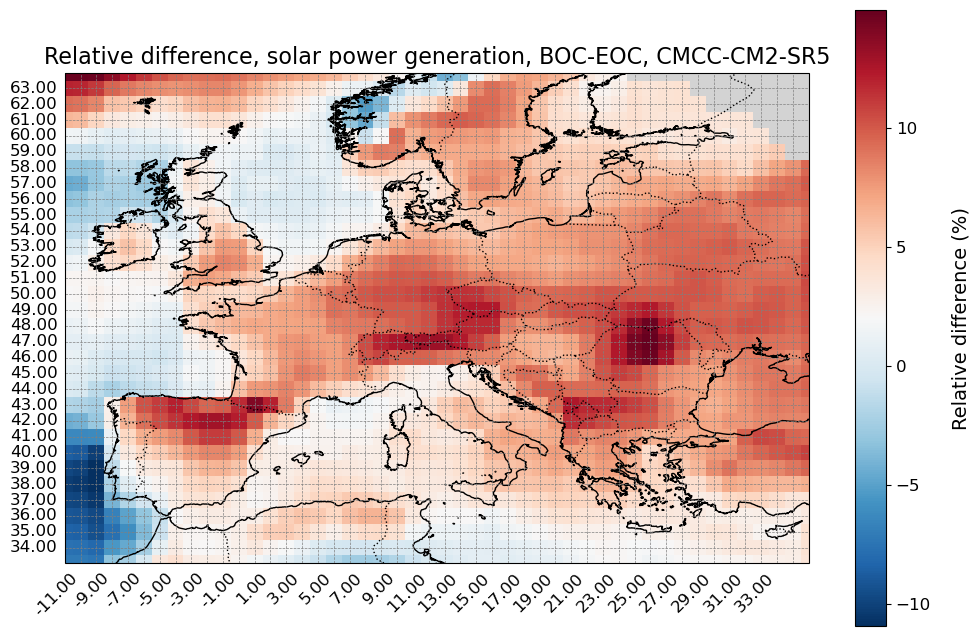

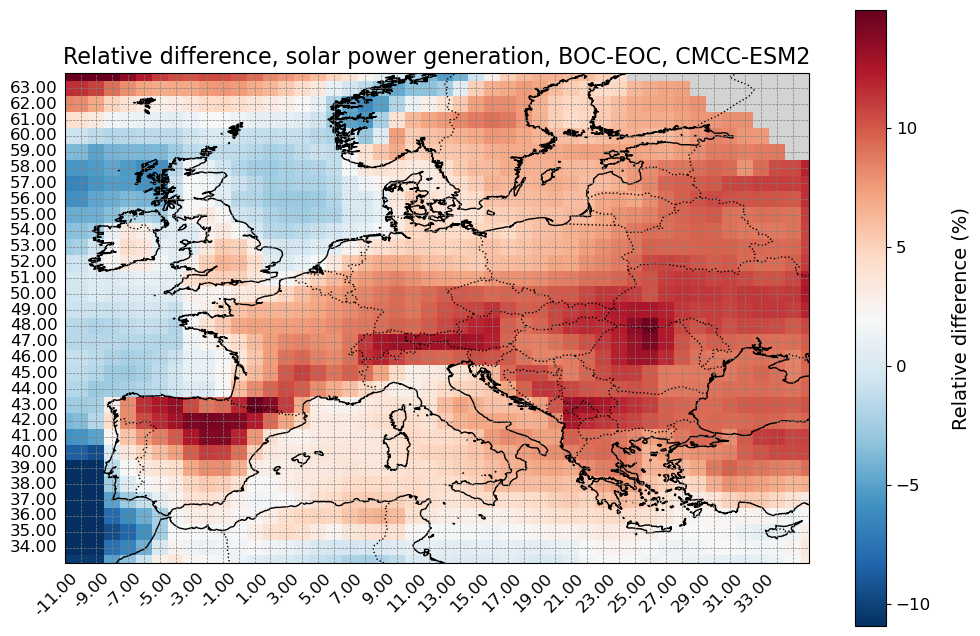

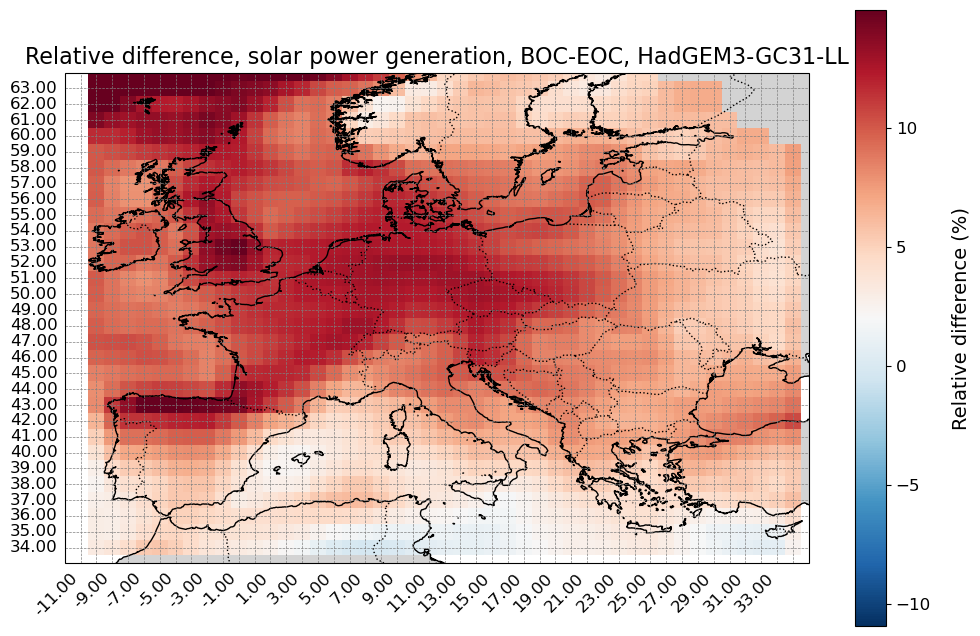

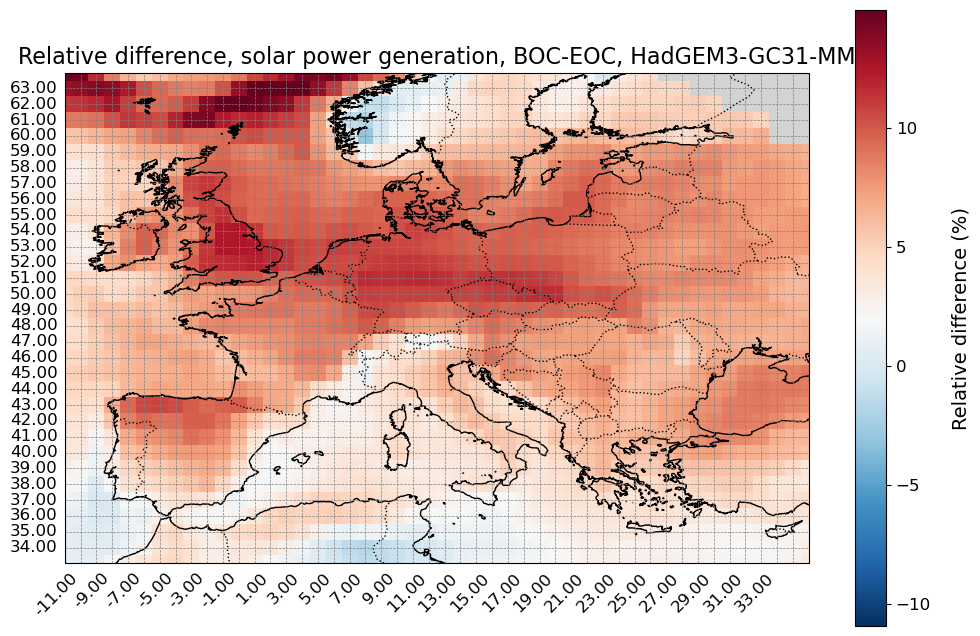

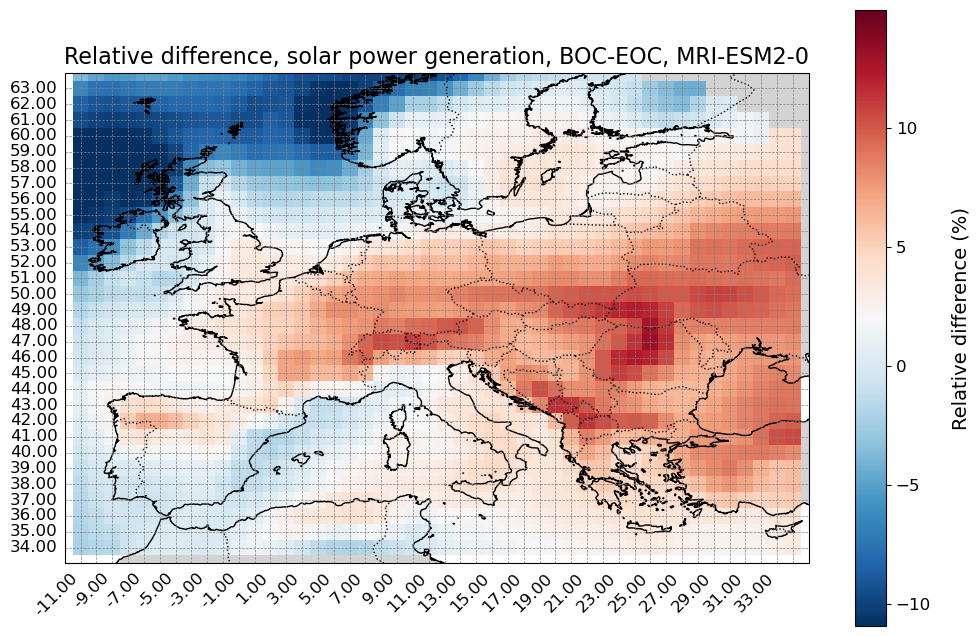

In [15]:
# Define the directory and models
models = ["ACCESS-CM2", "CanESM5", "CMCC-CM2-SR5", "CMCC-ESM2","HadGEM3-GC31-LL", "HadGEM3-GC31-MM", "MRI-ESM2-0"]  # Replace with actual model names
diri = "/work/users/s233224/Climate-Change-Impacted-Solar-Energy-Generation/power/"

# Initialize vmin and vmax
vmin = float("inf")
vmax = float("-inf")

# Dictionary to store relative differences for each model
relative_differences = {}
all_relative_differences = []

# Loop through each model
for model in models:
    # Define paths for BOC and EOC
    path_BOC = os.path.join(diri, model+"_1x1grid/historical/")
    print(path_BOC)
    path_EOC = os.path.join(diri, model+"_1x1grid/ssp585/")
    
    # Load BOC files
    files_BOC = [f"{path_BOC}aggregated_solar_power_{year}.nc" for year in range(1980, 2015)]
    datasets_BOC = []
    for year, file in zip(range(1980, 2015), files_BOC):
        ds_BOC = xr.open_dataset(file, engine="netcdf4")
        ds_BOC = ds_BOC.expand_dims(time=[year])
        datasets_BOC.append(ds_BOC)
    combined_ds_BOC = xr.concat(datasets_BOC, dim="time")
    mean_power_BOC = combined_ds_BOC["specific generation"].mean(dim="time")
    
    # Load EOC files
    files_EOC = [f"{path_EOC}aggregated_solar_power_{year}.nc" for year in range(2065, 2100)]
    datasets_EOC = []
    for year, file in zip(range(2065, 2100), files_EOC):
        ds_EOC = xr.open_dataset(file)
        ds_EOC = ds_EOC.expand_dims(time=[year])
        datasets_EOC.append(ds_EOC)
    combined_ds_EOC = xr.concat(datasets_EOC, dim="time")
    mean_power_EOC = combined_ds_EOC["specific generation"].mean(dim="time")
    
    # Calculate relative difference
    relative_difference = (mean_power_EOC - mean_power_BOC) / mean_power_BOC * 100
    relative_difference = relative_difference.sel(x=slice(-12, 35), y=slice(33, 65))
    relative_differences[model] = relative_difference
    # Collect all relative differences for global quantile calculation
    all_relative_differences.append(relative_difference)
    
    # Update vmin and vmax
    vmin = min(vmin, relative_difference.min().values)
    vmax = max(vmax, relative_difference.max().values)

# Combine all relative differences into a single array for quantile calculation
all_relative_differences_combined = xr.concat(all_relative_differences, dim="model")
q095, q995 = np.nanpercentile(all_relative_differences_combined, [0.5, 99.5])

for model, relative_difference in zip(models, all_relative_differences):
    relative_difference = relative_difference
    relative_differences[model] = relative_difference
    
    # Update vmin and vmax
    vmin = min(vmin, relative_difference.min().values)
    vmax = max(vmax, relative_difference.max().values)
    vmin,vmax = q095, q995
    

# Plot relative differences for each model
for model, relative_difference in relative_differences.items():
    from plots import map_plots
    
    map_plots(relative_difference,cmap='RdBu_r', vmin=vmin, vmax=vmax, title=f"Relative difference, solar power generation, BOC-EOC, {model}", label="Relative difference (%)")
    

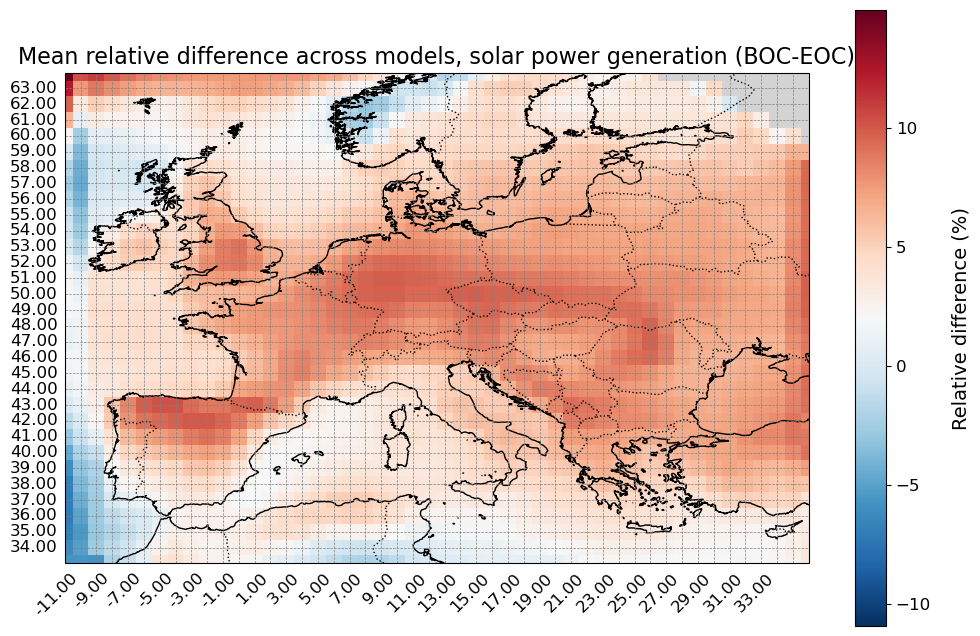

In [17]:
# 1) Compute the multi‐model mean
mean_rel_diff = all_relative_differences_combined.mean(dim="model")

# 2) Plot it with the same color‐limits you set before
from plots import map_plots

map_plots(
    mean_rel_diff,
    cmap='RdBu_r',
    vmin=q095,             # your 0.5th percentile
    vmax=q995,             # your 99.5th percentile
    title="Mean relative difference across models, solar power generation (BOC-EOC)",
    label="Relative difference (%)"
)


In [22]:

from matplotlib.colors import LinearSegmentedColormap
# 1) Grab the 'Blues' spectrum from 20%–100% so you lose the darkest navies
base = plt.cm.Blues(np.linspace(0.2, 1, 256))
light_blues = LinearSegmentedColormap.from_list("light_blues", base)

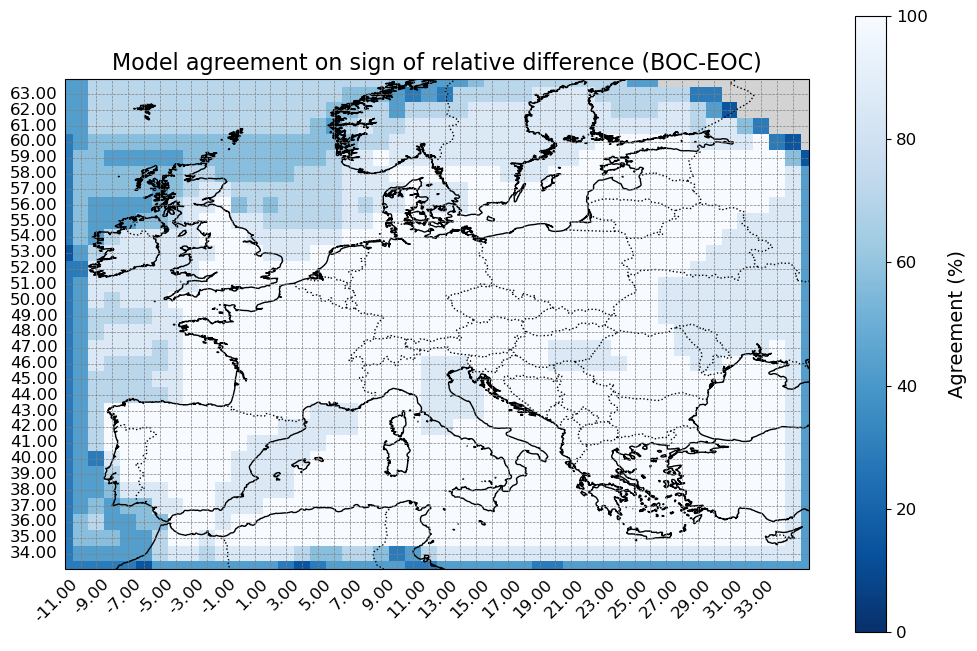

In [32]:
import pandas as pd
import numpy as np
import xarray as xr
from plots import map_plots

models = ["ACCESS-CM2", "CanESM5", "CMCC-CM2-SR5", "CMCC-ESM2",
          "HadGEM3-GC31-LL", "HadGEM3-GC31-MM", "MRI-ESM2-0"]

# 1) Stack all models into one DataArray with a "model" dimension
all_rel = xr.concat(
    [relative_differences[m] for m in models],
    dim=pd.Index(models, name="model")
)

# 2) Ensemble‐mean sign (+1 increase, -1 decrease)
ens_mean   = all_rel.mean(dim="model")
ens_sign   = np.sign(ens_mean)

# 3) Count how many models match that sign
model_signs   = np.sign(all_rel)
agreement_cnt = (model_signs == ens_sign).sum(dim="model")

# 4) Percentage agreement
agreement_pct = agreement_cnt / len(models) * 100

# 5) Plot
map_plots(
    agreement_pct,
    cmap="Blues_r",
    vmin=0, vmax=100,
    title='Model agreement on sign of relative difference (BOC-EOC)',
    label='Agreement (%)'
)


In [37]:
agreement_pct.mean()

<xarray.DataArray 'specific generation' ()> Size: 8B
array(81.52056277)

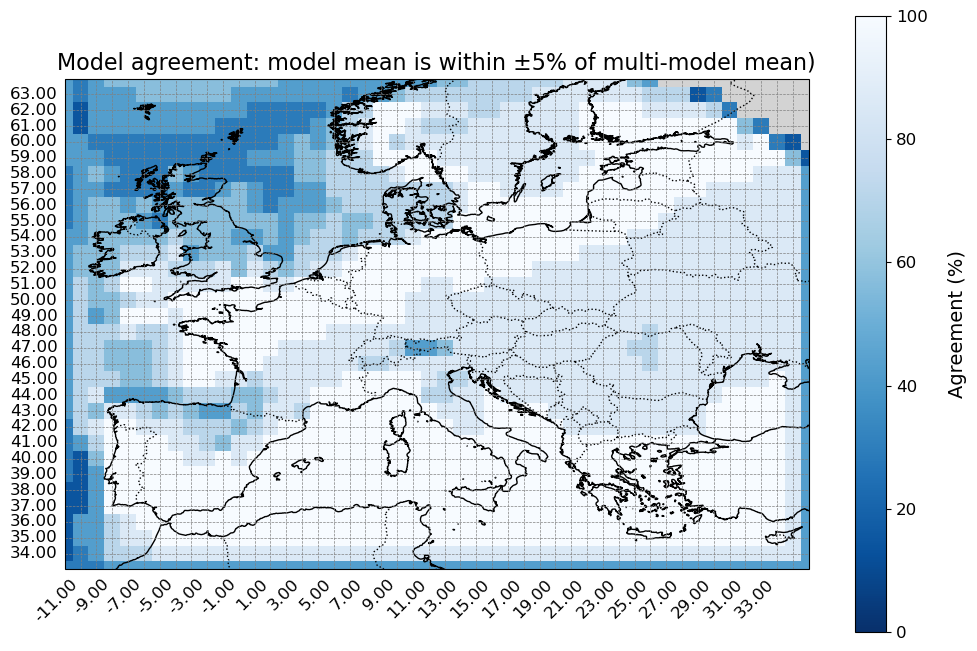

In [ ]:
# 1. Stack into one DataArray [model, y, x]
all_rel = xr.concat(
    [relative_differences[m] for m in models],
    dim = pd.Index(models, name="model")
)

# 2. Compute the multi‐model mean
ens_mean = all_rel.mean(dim="model")

# 3. Define your tolerance (e.g. ±5 % absolute difference)
tol = 5.0

# 4. Count how many models fall within ±tol of the mean
within_tol = (np.abs(all_rel - ens_mean) <= tol).sum(dim="model")

# 5. Convert to percent agreement
agreement_mag = within_tol / all_rel.sizes["model"] * 100

# 6. Plot that
map_plots(
    agreement_mag,
    cmap="Blues_r",
    vmin=0, vmax=100,
    title=f"Model agreement: model mean is within ±{tol:.0f}% of multi-model mean",
    label="Agreement (%)"
)


In [36]:
agreement_mag.mean()

<xarray.DataArray 'specific generation' ()> Size: 8B
array(76.41594517)

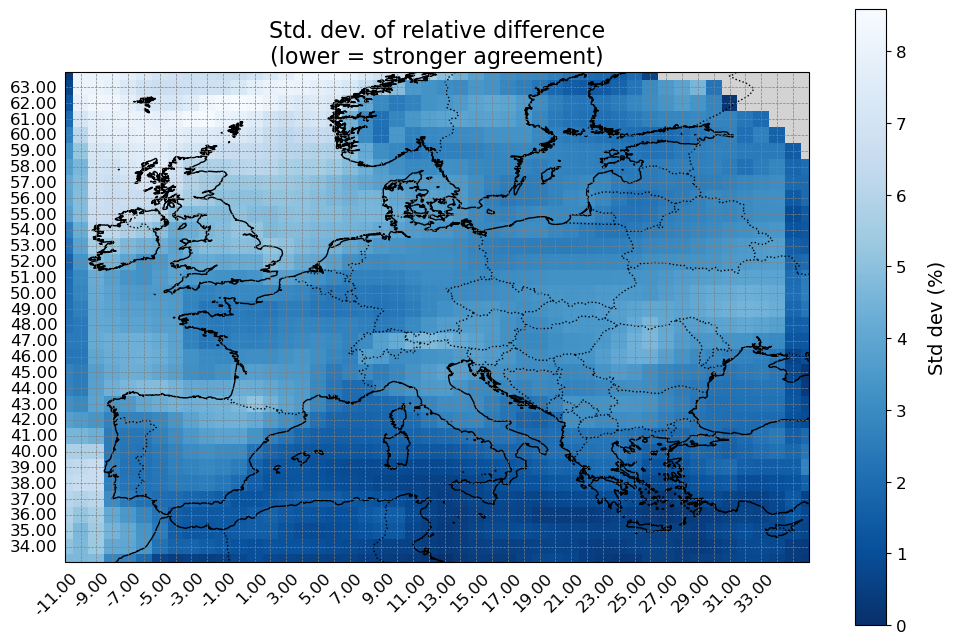

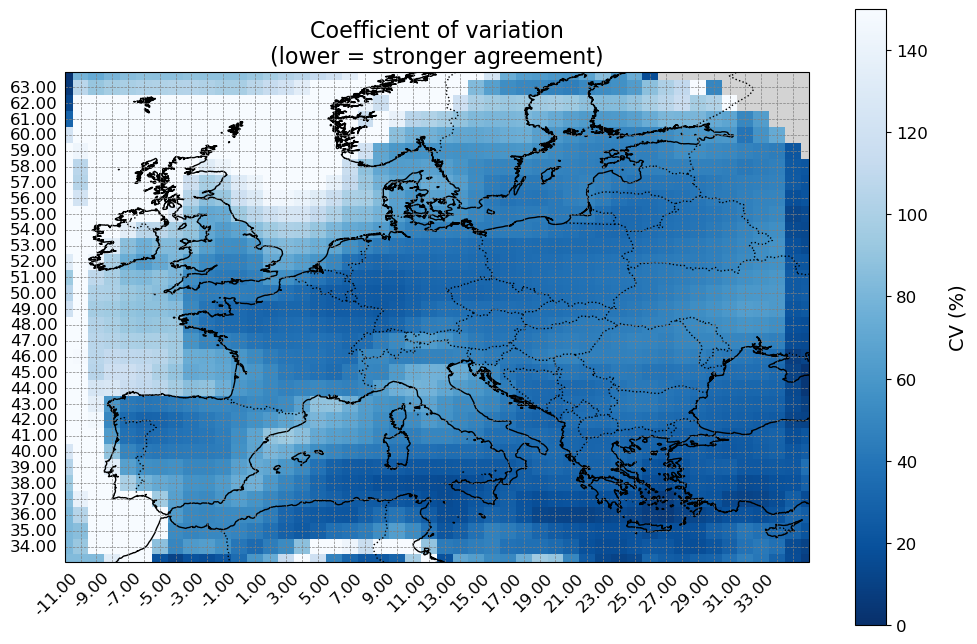

In [45]:
# Standard deviation
std_rel = all_rel.std(dim="model")

map_plots(
    std_rel,
    cmap="Blues_r",
    vmin=0, vmax=std_rel.max(),
    title="Std. dev. of relative difference\n(lower = stronger agreement)",
    label="Std dev (%)"
)

# Or coefficient of variation (std / mean)
cv_rel = std_rel / np.abs(ens_mean) * 100

map_plots(
    cv_rel,
    cmap="Blues_r",
    vmin=0, vmax=150,
    title="Coefficient of variation\n(lower = stronger agreement)",
    label="CV (%)"
)


In [44]:
std_rel.mean()

<xarray.DataArray 'specific generation' ()> Size: 8B
array(3.09257363)

In [46]:
cv_rel.mean()

<xarray.DataArray 'specific generation' ()> Size: 8B
array(150.11016086)

/tmp/ipykernel_125324/1746212074.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = mpl.cm.get_cmap('RdBu_r').copy()


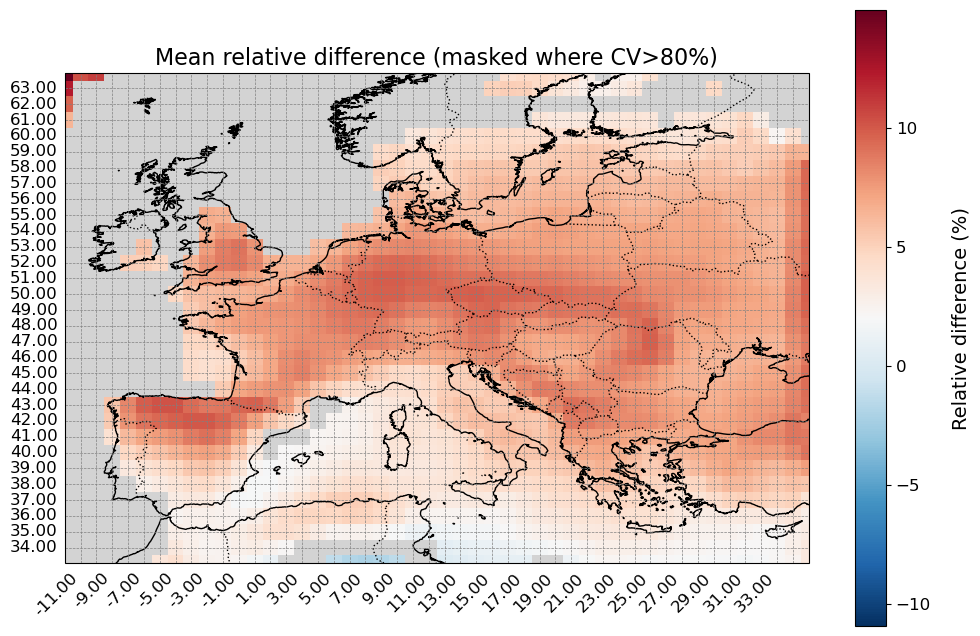

In [52]:
import matplotlib.pyplot as plt
import matplotlib as mpl
from plots import map_plots

# 1) Make a copy of RdBu_r and assign NaNs a grey color
cmap = mpl.cm.get_cmap('RdBu_r').copy()
cmap.set_bad(color='lightgrey')   # or any color that stands out

# 2) Mask out high‐CV cells
masked_mean = mean_rel_diff.where(cv_rel <= 80)

# 3) Plot with that colormap
map_plots(
    masked_mean,
    cmap=cmap,
    vmin=q095, vmax=q995,
    title="Mean relative difference (masked where CV>80%)",
    label="Relative difference (%)"
)



In [79]:
ds=xr.open_dataset("/work/users/s233224/Climate-Change-Impacted-Solar-Energy-Generation/power/ACCESS-CM2_1x1grid/ssp585/aggregated_solar_power_seasons_2070.nc")
ds

<xarray.Dataset> Size: 63kB
Dimensions:  (x: 48, y: 40)
Coordinates:
  * x        (x) float64 384B -12.0 -11.0 -10.0 -9.0 ... 32.0 33.0 34.0 35.0
    lon      (x) float64 384B ...
  * y        (y) float64 320B 33.0 34.0 35.0 36.0 37.0 ... 69.0 70.0 71.0 72.0
    lat      (y) float64 320B ...
Data variables:
    Winter   (y, x) float64 15kB ...
    Spring   (y, x) float64 15kB ...
    Summer   (y, x) float64 15kB ...
    Autumn   (y, x) float64 15kB ...

In [80]:
seasons = ["Winter", "Spring", "Summer", "Autumn"]
# Count NaNs for each season
nan_counts = {}
for season in seasons:
    # mag_agree[season] is a DataArray (y × x)
    n_nan = ds[season].isnull().sum().values
    nan_counts[season] = n_nan

print("Number of NaNs in Mean power per season:")
for season, count in nan_counts.items():
    print(f"  {season}: {count}")


Number of NaNs in Mean power per season:
  Winter: 0
  Spring: 0
  Summer: 0
  Autumn: 0


['Winter', 'Spring', 'Summer', 'Autumn']


/tmp/ipykernel_125324/798654327.py:69: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_bad = mpl.cm.get_cmap("RdBu_r").copy()


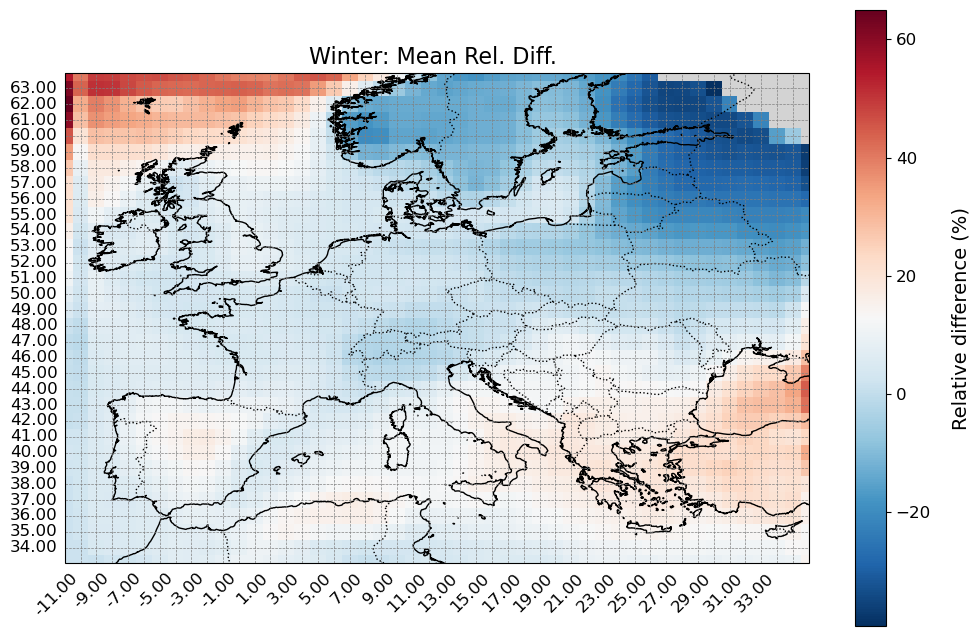

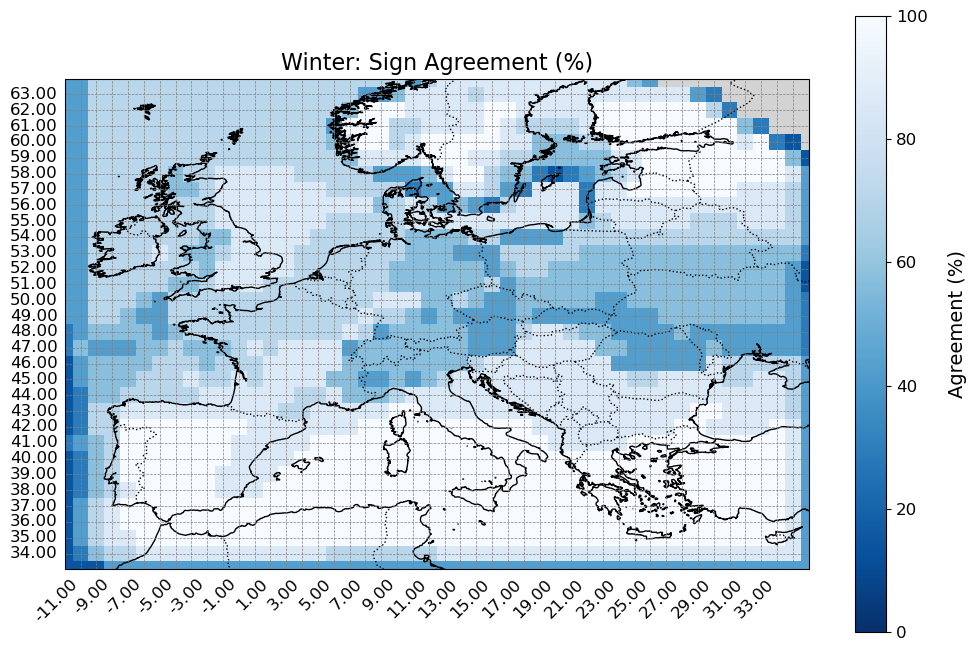

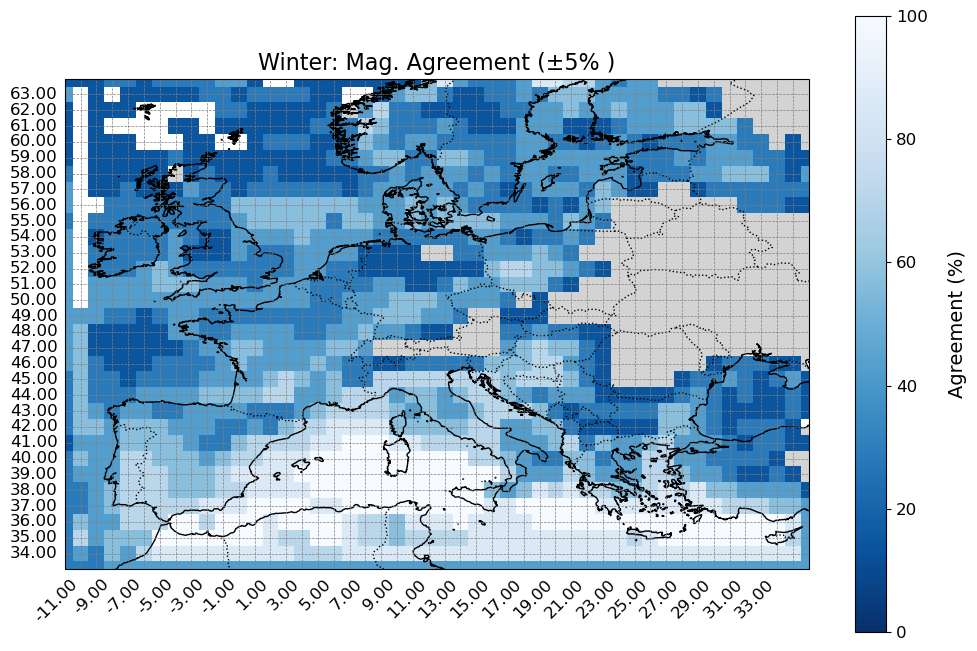

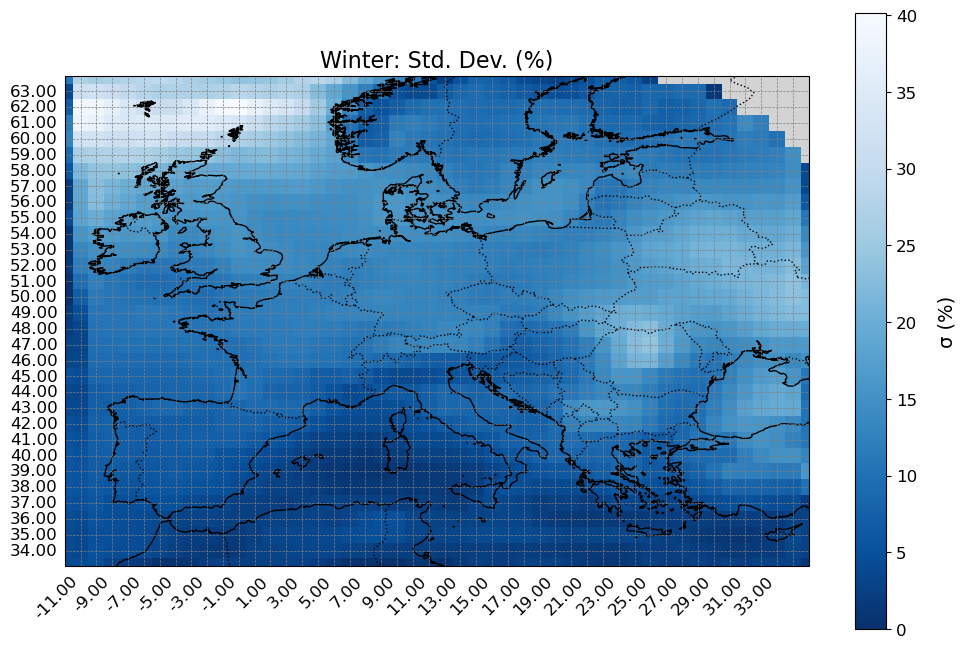

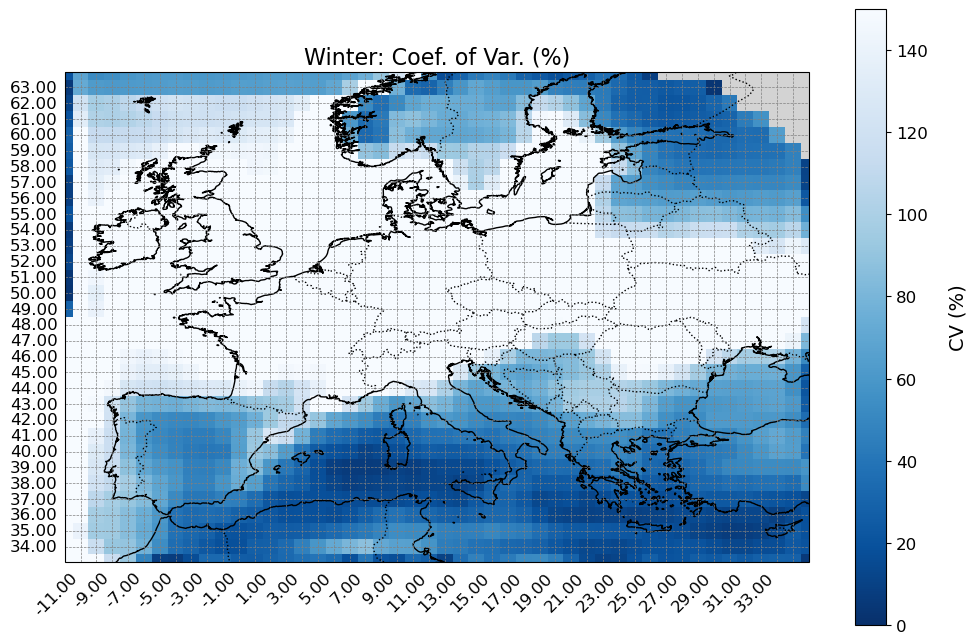

...

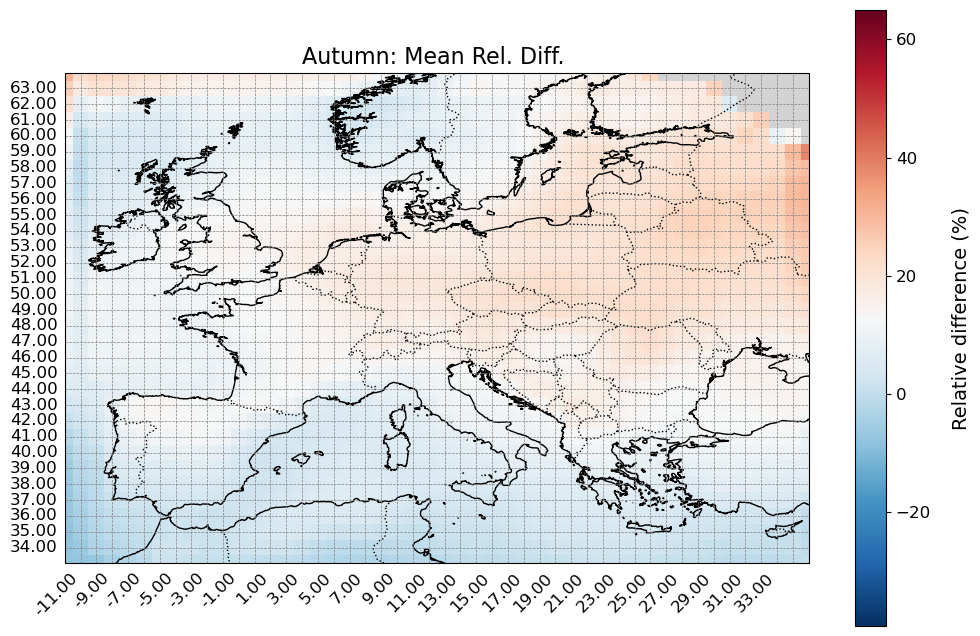

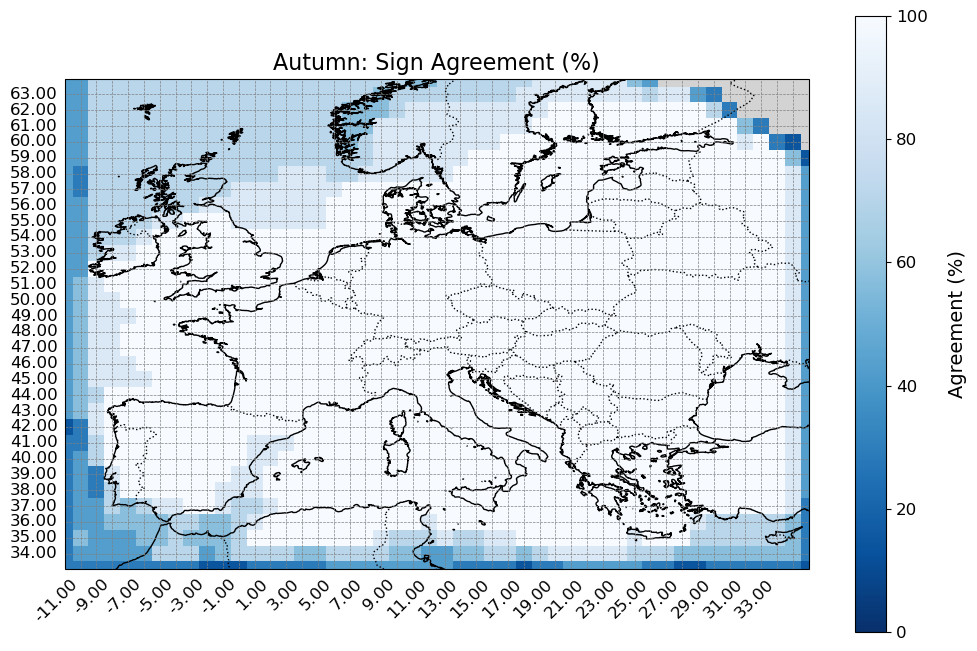

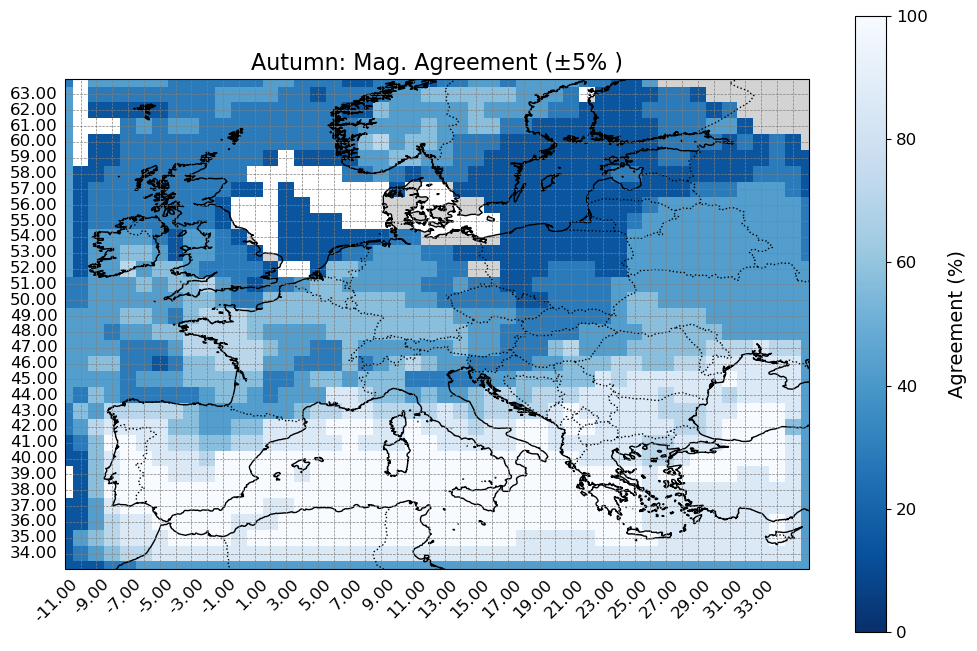

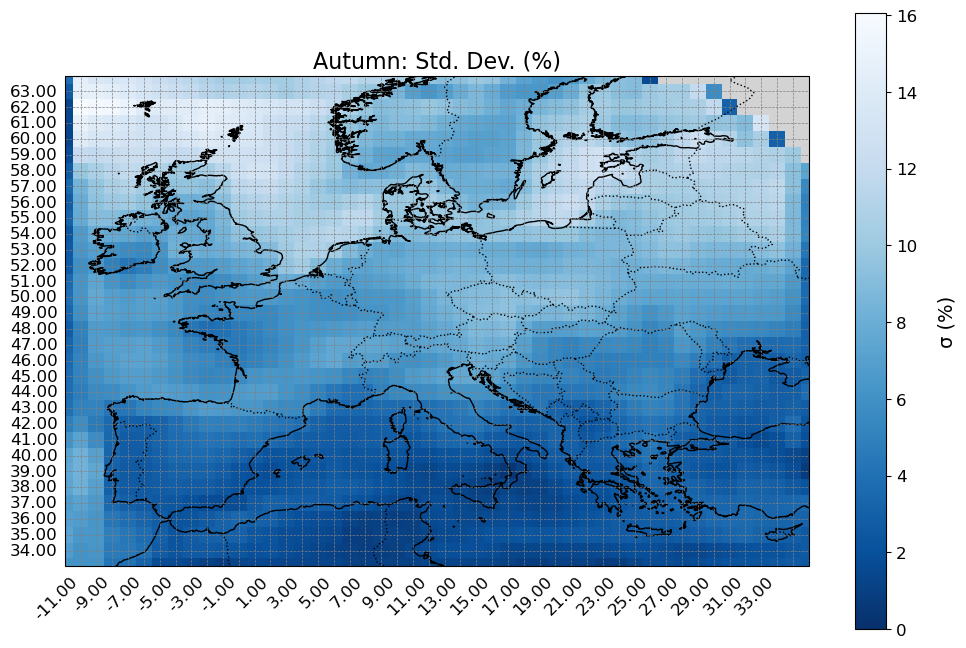

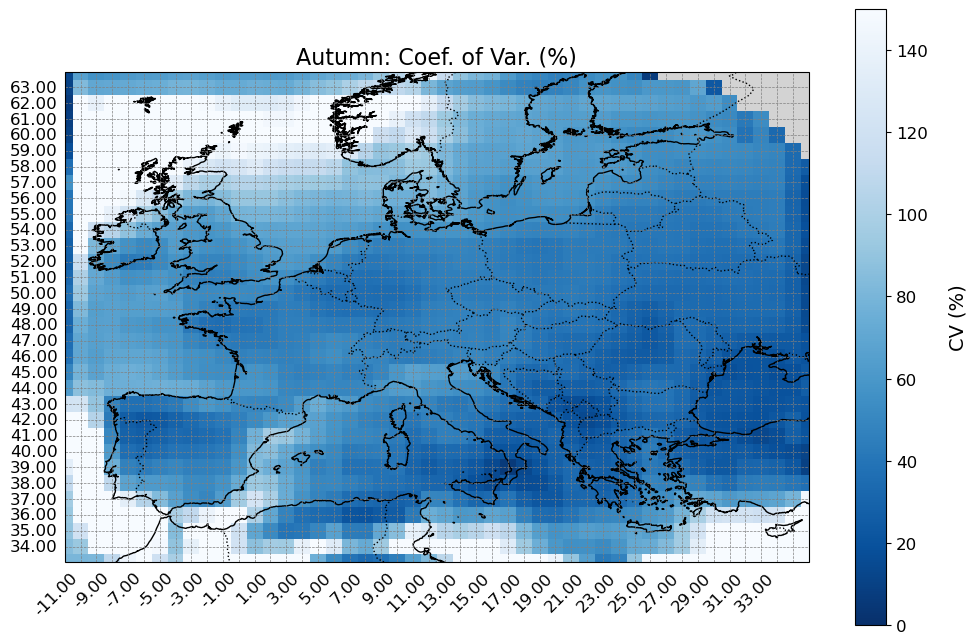

In [74]:
import os
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib as mpl
from plots import map_plots

# ── USER SETTINGS ─────────────────────────────────────────────────────────────
models   = ["ACCESS-CM2","CanESM5","CMCC-CM2-SR5","CMCC-ESM2",
            "HadGEM3-GC31-LL","HadGEM3-GC31-MM","MRI-ESM2-0"]
base_dir = "/work/users/s233224/Climate-Change-Impacted-Solar-Energy-Generation/power"
tol      = 5.0   # ±5 % for magnitude‐agreement
# ──────────────────────────────────────────────────────────────────────────────

# 1) Load seasonal‐means and compute Δ% per model
rel_diff = {}
for model in models:
    boc_files = [
        os.path.join(base_dir, f"{model}_1x1grid/historical/aggregated_solar_power_seasons_{yr}.nc")
        for yr in range(1980, 2015)
    ]
    eoc_files = [
        os.path.join(base_dir, f"{model}_1x1grid/ssp585/aggregated_solar_power_seasons_{yr}.nc")
        for yr in range(2065, 2100)
    ]
    ds_boc = xr.concat(
        [xr.open_dataset(f).expand_dims(time=[yr]) for yr,f in zip(range(1980,2015), boc_files)],
        dim="time"
    )
    ds_eoc = xr.concat(
        [xr.open_dataset(f).expand_dims(time=[yr]) for yr,f in zip(range(2065,2100), eoc_files)],
        dim="time"
    )
    rel_diff[model] = (ds_eoc.mean("time") - ds_boc.mean("time")) / ds_boc.mean("time") * 100

# 2) Identify seasons
seasons = list(rel_diff[models[0]].data_vars)
print(seasons)

# 3) Compute metrics per season
ens_mean   = {}
sign_agree = {}
mag_agree  = {}
std_dev    = {}
cv         = {}

for season in seasons:
        all_rel = xr.concat(
            [ rel_diff[m][season] for m in models ],
            dim = pd.Index(models, name="model")
        )
        ens_mean[season]   = all_rel.mean("model")
        model_signs        = np.sign(all_rel)
        ens_sign           = np.sign(ens_mean[season])
        sign_agree[season] = (model_signs == ens_sign).sum("model") / len(models) * 100
        mag_agree[season]  = (np.abs(all_rel - ens_mean[season]) <= tol).sum("model") / len(models) * 100
        std_dev[season]    = all_rel.std("model")
        cv[season]         = std_dev[season] / np.abs(ens_mean[season]) * 100

# 4) Mask mean Δ% where CV>100% and compute common vmin/vmax (5–95%)
masked_means = {
    season: ens_mean[season].where(cv[season] <= 100)
    for season in seasons
}
stacked = xr.concat(list(masked_means.values()), dim="season")
vmin, vmax = np.nanpercentile(stacked.values, [0,100])

# 5) Prepare a “bad data” colormap for masking
cmap_bad = mpl.cm.get_cmap("RdBu_r").copy()
cmap_bad.set_bad("lightgrey")

# 6) Plot all maps per season
for season in seasons:
    # Mean Δ%
    map_plots(
        ens_mean[season],
        cmap=cmap_bad,
        vmin=vmin, vmax=vmax,
        title=f"{season}: Mean Rel. Diff. ",
        label="Relative difference (%)"
    )
    # Sign agreement
    map_plots(
        sign_agree[season],
        cmap="Blues_r",
        vmin=0, vmax=100,
        title=f"{season}: Sign Agreement (%)",
        label="Agreement (%)"
    )
    # Magnitude agreement
    map_plots(
        mag_agree[season],
        cmap="Blues_r",
        vmin=0, vmax=100,
        title=f"{season}: Mag. Agreement (±{tol:.0f}% )",
        label="Agreement (%)"
    )
    # Std. dev.
    map_plots(
        std_dev[season],
        cmap="Blues_r",
        vmin=0, vmax=float(std_dev[season].max()),
        title=f"{season}: Std. Dev. (%)",
        label="σ (%)"
    )
    # Coef. of var.
    map_plots(
        cv[season],
        cmap="Blues_r",
        vmin=0, vmax=150,
        title=f"{season}: Coef. of Var. (%)",
        label="CV (%)"
    )

